# Machine Learning face detection

This project aims to develop a simple face detection system in images using Scikit-learn and OpenCV libraries, with limited computing capacity. Specifically, the project will implement a machine learning pipeline that identifies the faces present in images and shows the coordinates of the bounding boxes where the faces are located.

In [ ]:
from pathlib import Path
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.feature import hog
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, precision_recall_curve, 
    roc_curve, average_precision_score
)
from scipy.stats import loguniform
import joblib
import random
from tqdm.notebook import tqdm
from collections import Counter

In [8]:
# Setting some parameters for matplotlib figures
plt.rcParams["figure.dpi"] = 240
sns.set_theme()

## 1) Data exploration and preprocessing

In this section, a proper dataset for the **face detection** task is obtained by combining examples of faces (**positive class**) and non-faces (**negative class**) images.

### UTKFace Dataset

For the faces images, the [UTKFace](https://www.kaggle.com/datasets/jangedoo/utkface-new) dataset, obtained from Kaggle, is used. This dataset consists of over 20,000 face images (all with 200x200 size) with long age span and large variation in pose, facial expression, illumination, ecc.

In [27]:
# Get the list of all images
UTK_PATH = Path("UTKFace") 
all_imgs = [f for f in UTK_PATH.iterdir() if f.is_file()]
print(f"Total number of images: {len(all_imgs)}")

Total number of images: 23708


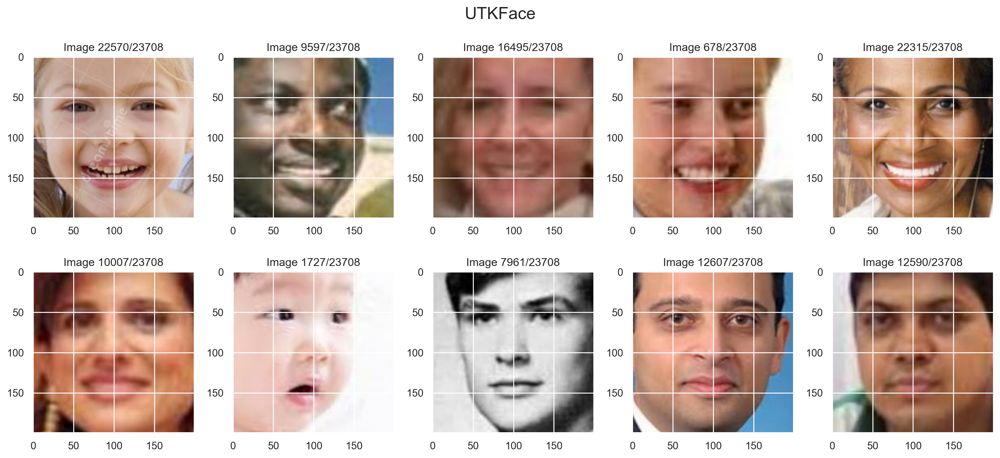

In [29]:
#Show 10 random images in the dataset
plt.figure(figsize=(15, 7))

for i, n in enumerate(random.sample(range(len(all_imgs)), 10)):
    img = cv2.imread(all_imgs[n])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Image {n}/{len(all_imgs)}")

plt.suptitle(f"UTKFace", fontsize=18)
plt.tight_layout()
plt.show()

### Caltech 256 Image Dataset

For non-faces images, the [Caltech 256](https://www.kaggle.com/datasets/jessicali9530/caltech256) dataset, also obtained from Kaggle, is used. It consists of over 30,000 images (of varying sizes) spanning 257 extremely diverse object categories.

In [30]:
# Get the list of all directories (categories)
CALTECH_PATH = Path("256_ObjectCategories") 
dirs = [d for d in CALTECH_PATH.iterdir() if d.is_dir()]

print(f"{len(dirs)} categories in '{CALTECH_PATH.name}':")
print(f"First 10 categories: {[cat.name for cat in dirs[:10]]}")

total_images = 0
for i in range(len(dirs)):
    images = [f for f in dirs[i].iterdir() if f.is_file()]
    total_images += len(images)

print(f"\nTotal number of images: {total_images}")

257 categories in '256_ObjectCategories':
First 10 categories: ['001.ak47', '002.american-flag', '003.backpack', '004.baseball-bat', '005.baseball-glove', '006.basketball-hoop', '007.bat', '008.bathtub', '009.bear', '010.beer-mug']

Total number of images: 30608


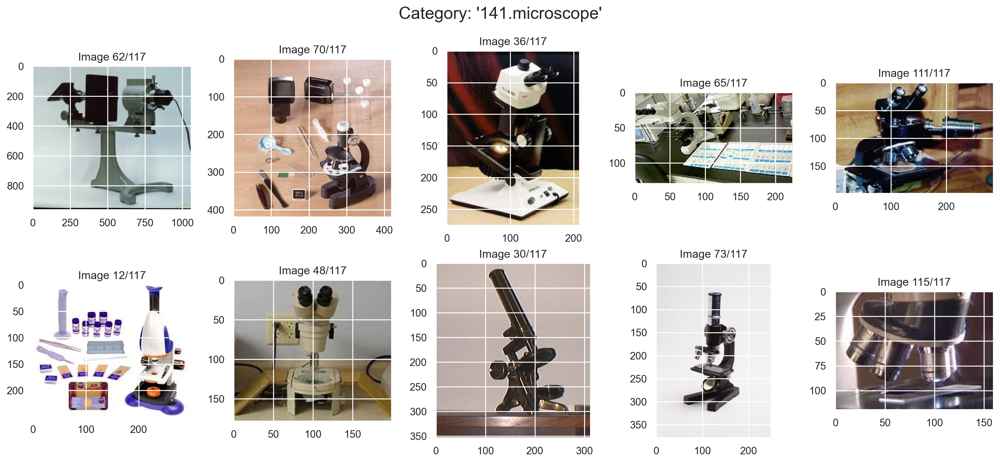

In [41]:
# Select a random directory (category)
dir_n = random.sample(range(len(dirs)), 1)[0]
all_imgs = [f for f in dirs[dir_n].iterdir() if f.is_file()]

# Show 10 random images
plt.figure(figsize=(15, 7))

for i, n in enumerate(random.sample(range(len(all_imgs)), 10)):
    img = cv2.imread(all_imgs[n])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Image {n}/{len(all_imgs)}")

plt.suptitle(f"Category: '{dirs[dir_n].name}'", fontsize=18)
plt.tight_layout()
plt.show()

### Dataset creation

The Caltech 256 dataset contains three categories with human faces that would contaminate the **negative** (non-face) class:
* "159.people"
* "205.superma"
* "253.faces-easy-101"

To address this issue, firstly, a list of allowed categories is created. Then, a list of file paths that only come from those categories will be extracted.

In [42]:
# Categories to exclude
blocked = {"159.people", "205.superman","253.faces-easy-101"}

# Get allowed Caltech categories
allowed_dirs = [d for d in CALTECH_PATH.iterdir() if d.is_dir() and d.name not in blocked]

print(f"Allowed categories: {len(allowed_dirs)} of 257")

Allowed categories: 254 of 257


Next, a balanced **10000 image dataset** is created by randomly sampling **5000** face images from **UTKFace** dataset and **5000** non-face images from the filtered **Caltech 256** dataset. Each image is resized to **128×128** pixels and saved to different directories.

In [43]:
NUM_PER_CLASS = 5000
IMG_SIZE = 128

# Define new folders for the face detection dataset
DATASET_DIR  = Path("fd_dataset")
POS_DIR  = DATASET_DIR / "face"
NEG_DIR  = DATASET_DIR / "non_face"

# Create directories for negative and positive classes
for p in (NEG_DIR, POS_DIR):
    p.mkdir(parents=True, exist_ok=True)

In [44]:
# Function to resize and save images
def read_resize_save(src_path, dst_dir, idx):
    """
    Read image (BGR), resize and save as RGB .jpg in dst_dir.
    """
    img = cv2.imread(str(src_path))

    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    fname = f"{src_path.stem}_{idx:05d}.jpg"
    cv2.imwrite(str(dst_dir / fname), cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
    return True

In [45]:
# 1) Positive class

utk_files = list(UTK_PATH.glob("*.jpg"))
pos_sample = random.sample(utk_files, NUM_PER_CLASS)

print("Copying images from UTKFace to face/…")
for i, fp in enumerate(tqdm(pos_sample)):
    read_resize_save(fp, POS_DIR, i)

Copying images from UTKFace to face/…


  0%|          | 0/5000 [00:00<?, ?it/s]

In [46]:
# 2) Negative class

caltech_files = []
# Include all images in the allowed categories
for cat_dir in allowed_dirs:
    caltech_files.extend(cat_dir.glob("*.jpg"))

neg_sample = random.sample(caltech_files, NUM_PER_CLASS)

print("Copying allowed images from Caltech 256 to non_face/…")
for i, fp in enumerate(tqdm(neg_sample)):
    read_resize_save(fp, NEG_DIR, i)

Copying allowed images from Caltech 256 to non_face/…


  0%|          | 0/5000 [00:00<?, ?it/s]

In [47]:
# Check if the dataset sizes are correct
face_count = len([f for f in POS_DIR.iterdir() if f.is_file()])
non_face_count  = len([f for f in NEG_DIR.iterdir() if f.is_file()])

print(f"Faces:     {face_count}")
print(f"Non-faces: {non_face_count}")

Faces:     5000
Non-faces: 5000


In [48]:
# Function to show 10 random images in the datasets
def show_samples(dir_path, title):
    files = random.sample(list(dir_path.iterdir()), 10)
    plt.figure(figsize=(15,6))
    for i, f in enumerate(files):
        img = cv2.imread(f)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

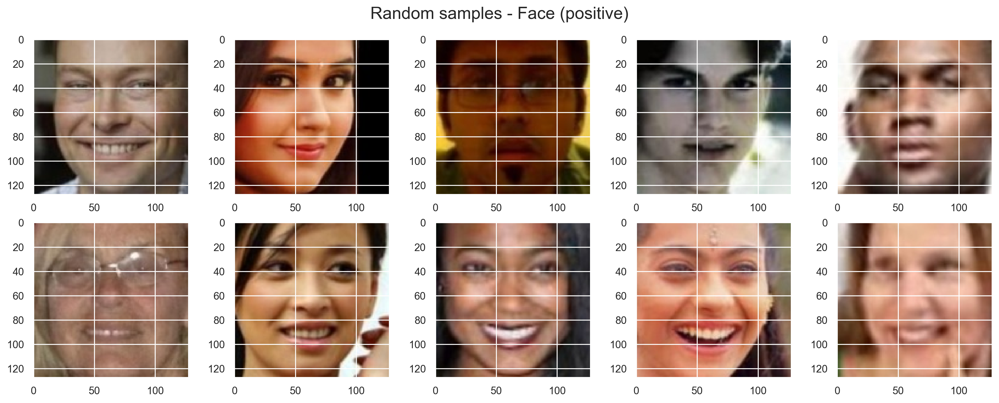

In [53]:
show_samples(POS_DIR, "Random samples - Face (positive)")

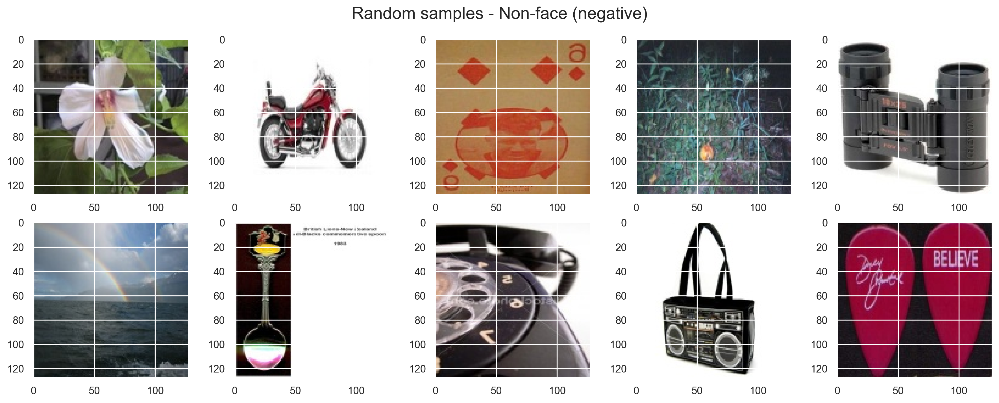

In [15]:
show_samples(NEG_DIR, "Random samples - Non-face (negative)")

## 2) Dataset preparation

In this section, the image dataset is further transformed and organized to be properly processed by a machine learning algorithm. 

Firstly, a **feature extraction** method for images will be implemented: the **Histogram of Oriented Gradients (HOG)**. The HOG feature descriptor obtains a simplified representation of the image containing only the most important information. Specifically, it analyzes the distribution of edge orientations within the image to describe its shape and appearance. More information on the HOG feature descriptor can be found in [this article](https://www.analyticsvidhya.com/blog/2019/09/feature-engineering-images-introduction-hog-feature-descriptor/).

### Setting HOG hyper-parameters

To generate the HOG features, the [*hog*](https://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hog) function from *skimage.features* will be used, which takes the original images and some hyperparameters as input and directly returns the feature matrix.

In this case, the following configuration for the 128×128 images will be used:
* **orientations**: 9 (standard number of orientation bins)
* **pixels_per_cell**: (8,8) (size of the cell for which edges distrubutions are created)
* **cells_per_block**: (2,2) (number of cells in each block over which distributions are normalized)
* **block_norm**: "L2-Hys" (block normalization method)

This will result in **15 × 15 x 36 = 8100 features** per image.

In [54]:
# Define HOG settings
hog_params = dict(
    orientations=9,
    pixels_per_cell=(8, 8),
    cells_per_block=(2, 2),
    block_norm="L2-Hys",
)

In [17]:
# Function to show 5 random samples of original images (coverted in greyscale) and HOG descriptors
def show_samples(dir_path, title):
    files = random.sample(list(dir_path.iterdir()), 5)

    plt.figure(figsize=(15,6))
    for i, f in enumerate(files):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        feat, hog_image = hog(img, visualize=True, **hog_params)
        plt.subplot(2, 5, i+1)  
        plt.imshow(img, cmap=plt.cm.gray)
        plt.subplot(2, 5, i+6)  
        plt.imshow(hog_image, cmap=plt.cm.gray)
    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

    print(f"Number of features per images: {feat.shape[0]}")

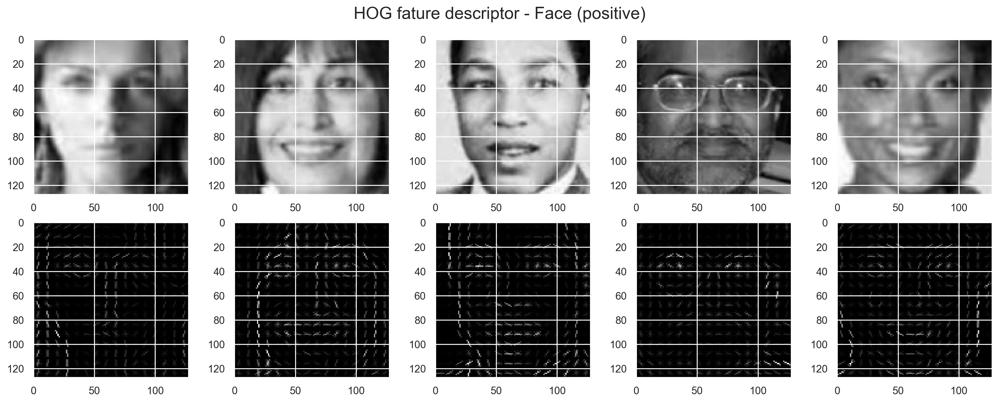

Number of features per images: 8100


In [18]:
show_samples(POS_DIR, "HOG fature descriptor - Face (positive)")

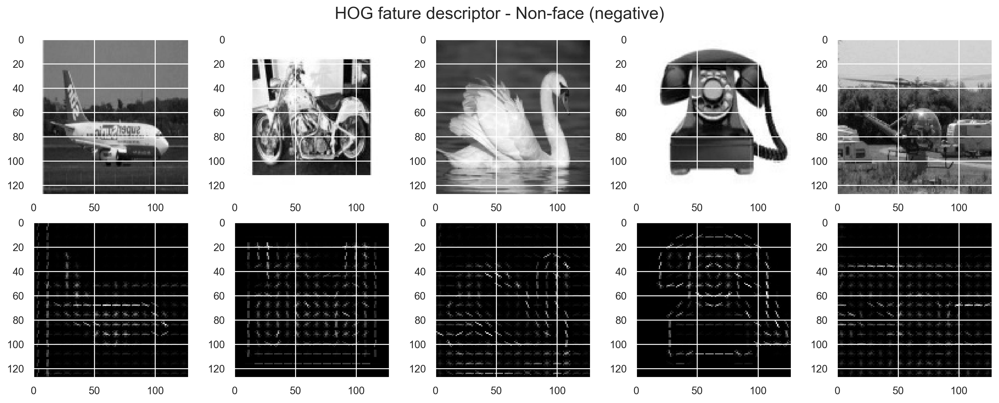

Number of features per images: 8100


In [19]:
show_samples(NEG_DIR, "HOG fature descriptor - Non-face (negative)")

### Extracting HOG feature matrix

Here, each image in the dataset is converted to **grayscale** and **HOG descriptors** are extracted to create the feature matrix **X** and the label vector **y**.

In [55]:
# Function to extract HOG descriptors and create the X matrix (n_samples x n_features) and the y vector (n_samples,)
def build_feature_matrix():

    X, y = [], []

    # Positive class (Face) = label 1
    for f in tqdm(sorted(POS_DIR.iterdir()), desc=f"{"Faces":<10}"):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        feat = hog(img, **hog_params)
        X.append(feat)
        y.append(1)

    # Negative class (Non-face) = label 0
    for f in tqdm(sorted(NEG_DIR.iterdir()), desc=f"{"Non-faces":<10}"):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        feat = hog(img, **hog_params)
        X.append(feat)
        y.append(0)

    X = np.asarray(X, dtype=np.float32)
    y = np.asarray(y, dtype=np.int8)
    return X, y

In [56]:
# Defining features and label variables
X, y = build_feature_matrix()

Faces     :   0%|          | 0/5000 [00:00<?, ?it/s]

Non-faces :   0%|          | 0/5000 [00:00<?, ?it/s]

In [57]:
print(f"Dataset size: {X.shape[0]} samples (with {X.shape[1]} features)")

class_count = Counter(y)
print("\nDataset class distribution:")
print(f"  0 (Non-face): {class_count[0]} samples")
print(f"  1 (Face): {class_count[1]} samples")

balance_ratio = class_count[0] / class_count[1]
print(f"\nClass balance: 1:{int(balance_ratio)}")

Dataset size: 10000 samples (with 8100 features)

Dataset class distribution:
  0 (Non-face): 5000 samples
  1 (Face): 5000 samples

Class balance: 1:1


### Train / test splitting

In [58]:
# Splitting data into training (80%) and testing (20%) datasets (with stratified sampling to keep the 1:1 ratio) 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y)

In [59]:
print(f"Training set size: {X_train.shape[0]} samples (with {X_train.shape[1]} features)")
training_class_count = Counter(y_train)
print("Class distribution in training set:")
print(f"  0 (Non-face): {training_class_count[0]}")
print(f"  1 (Face): {training_class_count[1]}")

print(f"\nTest set size: {X_test.shape[0]} samples (with {X_test.shape[1]} features)")
test_class_count = Counter(y_test)
print("Class distribution in test set:")
print(f"  0 (Non-face): {test_class_count[0]}")
print(f"  1 (Face): {test_class_count[1]}")

Training set size: 8000 samples (with 8100 features)
Class distribution in training set:
  0 (Non-face): 4000
  1 (Face): 4000

Test set size: 2000 samples (with 8100 features)
Class distribution in test set:
  0 (Non-face): 1000
  1 (Face): 1000


## 3) Model training

In this section, a machine learning model, optimized to use few resources, will be trained from scratch to classify faces from non faces. Specifically, the model will be a **Support Vector Classifier (SVC)**, implemented within the Scikit Learn library, as it is a fast model to train, does not require large computational resources and a large amount of training data.

The model will be optimized by finding the best combinations of some hyper-parameters (*C*, *kernel*, *gamma*) through a **randomized search**, performed using the *Random Search* method, where values are explored not systematically but more efficiently, by extracting them from a probability distribution.

### Definition of the pipeline and hyper-parameter distributions

First, an operation pipeline is defined, including the *StandardScaler*, to standardize features
with zero mean and unit variance, and the *SVC* estimator.

In [25]:
pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(max_iter=1000))
])

The randomized search will test 30 random combinations sampled from parameters distributions specified by two disctionaries:

1) Include **"linear" kernel** and only a range of **C** parameters
2) Include **"rbf" kernel** and a range of both **C** and **gamma** parameters

In [26]:
param_distributions = [
    {
        "svc__kernel": ["linear"],
        "svc__C":      loguniform(1e-2, 1e3)
    },
    {
        "svc__kernel": ["rbf"],
        "svc__C":      loguniform(1e-2, 1e3),
        "svc__gamma":  loguniform(1e-4, 1e-1)
    }
]

### Randomized search

The *RandomizedSearchCV* class implemented by Scikit Learn will optimize the parameters of the estimator by performing a 5-fold cross validation. The accuracy metric is used to evaluate the performance of the cross-validated model.

In [32]:
search = RandomizedSearchCV(
    estimator=pipe,
    param_distributions=param_distributions,
    n_iter=10,
    cv=5,
    scoring="accuracy",
    n_jobs=5,
    verbose=2
)

search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


c:\Users\luigi\anaconda3\envs\geospatial\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                             ('svc', SVC(max_iter=1000))]),
                   n_jobs=5,
                   param_distributions=[{'svc__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x0000026B5AA4F980>,
                                         'svc__kernel': ['linear']},
                                        {'svc__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x0000026B5A284560>,
                                         'svc__gamma': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x0000026B5AE3E240>,
                                         'svc__kernel': ['rbf']}],
                   scoring='accuracy', verbose=2)

In [57]:
print("Best CV accuracy: ", search.best_score_.round(4))
print("Best parameters:", search.best_params_)

Best CV accuracy:  0.9992
Best parameters: {'svc__C': 3.8138918027026576, 'svc__kernel': 'linear'}


### Analysis of the full CV table

Here, the dictionary returned in *search.cv_results_* is moved into a **DataFrame** and sorted by mean test accuracy.

In [52]:
cv_df = (
    pd.DataFrame(search.cv_results_)
    .sort_values("mean_test_score", ascending=False)
    .reset_index(drop=True)
)

cv_df[[
    "rank_test_score",
    "mean_test_score",
    "param_svc__kernel",
    "param_svc__C",
    "param_svc__gamma",
    "mean_fit_time"
]]

,rank_test_score,mean_test_score,param_svc__kernel,param_svc__C,param_svc__gamma,mean_fit_time
0,1,0.999250,linear,3.813892,NaN,98.310600
1,1,0.999250,linear,59.262826,NaN,128.548321
2,1,0.999250,linear,223.771033,NaN,114.150300
3,1,0.999250,linear,0.513805,NaN,128.841769
4,5,0.998750,rbf,935.195380,0.000102,127.699082
5,6,0.996875,rbf,0.103564,0.000122,477.547926
6,7,0.956375,rbf,288.435931,0.001686,613.429192
7,8,0.927500,rbf,21.654952,0.002269,287.206010
8,9,0.885875,rbf,2.049851,0.037888,298.157503
9,10,0.736625,rbf,2.482356,0.003278,305.795781


In [53]:
# Saving the cv_results_ dataframe
cv_df.to_csv("cv_results.csv")

Next, the model configurations with the best parameters for **linear** and **rbf** kernel will be used to fit 2 final SVC models on the full training dataset with enabled **probability estimates**, allowing to perform detailed evaluations on the test dataset.

### Full training 1 (SVC, linear kernel, best parameters)

In [53]:
linear_kernel_results = cv_df[cv_df["param_svc__kernel"]=="linear"].reset_index(drop=True)
params = {
    k.replace("param_svc__", ""): v
    for k, v in linear_kernel_results.iloc[0].items()
    if k.startswith("param_") and not k.endswith("_gamma")
}
params

{'C': 3.8138918027026576, 'kernel': 'linear'}

In [54]:
svc_linear_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(max_iter=1000, probability=True, **params))
])

svc_linear_pipe.fit(X_train, y_train)

c:\Users\luigi\anaconda3\envs\geospatial\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 SVC(C=3.8138918027026576, kernel='linear', max_iter=1000,
                     probability=True))])

In [65]:
# Save the fitted model
joblib.dump(svc_linear_pipe, "svc_linear_best.joblib")

['svc_linear_best.joblib']

### Full training 2 (SVC, rbf kernel, best parameters)

In [58]:
rbf_kernel_results = cv_df[cv_df["param_svc__kernel"]=="rbf"].reset_index(drop=True)
params = {
    k.replace("param_svc__", ""): v
    for k, v in rbf_kernel_results.iloc[0].items()
    if k.startswith("param_")
}
params

{'C': 935.1953803469754, 'gamma': 0.0001020863626743, 'kernel': 'rbf'}

In [59]:
svc_rbf_pipe = Pipeline([
    ("scaler", StandardScaler()),
    ("svc", SVC(max_iter=1000, probability=True, **params))
])

svc_rbf_pipe.fit(X_train, y_train)

c:\Users\luigi\anaconda3\envs\geospatial\Lib\site-packages\sklearn\svm\_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 SVC(C=935.1953803469754, gamma=0.0001020863626743,
                     max_iter=1000, probability=True))])

In [68]:
# Save the fitted model
joblib.dump(svc_rbf_pipe, "svc_rbf_best.joblib")

['svc_rbf_best.joblib']

## 4) Model evaluation

In this section, the two tuned and trained models are evaluated on the test set that has never been seen during training and hyper-parameter search.

In [69]:
MODELS = {
    "linear": svc_linear_pipe,
    "rbf":    svc_rbf_pipe
}

In [70]:
results = {}

for name, model in MODELS.items():

    # Predictions on test set
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    # Calculate metrics
    metrics = {}
    metrics['accuracy'] = accuracy_score(y_test, y_pred)
    metrics['precision'] = precision_score(y_test, y_pred)
    metrics['recall'] = recall_score(y_test, y_pred)
    metrics['f1'] = f1_score(y_test, y_pred)
    metrics['roc_auc'] = roc_auc_score(y_test, y_proba)
    metrics['pr_auc'] = average_precision_score(y_test, y_proba)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Store results
    results[name] = {
        'metrics': metrics,
        'confusion_matrix': cm,
        'predictions': y_proba
    }

### Summary of metrics

In [122]:
model_results = list(results.values())
print(f" {"":<15} {list(results.keys())[0].upper()+" kernel":<15} {list(results.keys())[1].upper()+" kernel":<15}")
for metric, value in model_results[0]['metrics'].items():
        print(f" {metric+":":<15} {model_results[0]['metrics'][metric]:<15.4f} {model_results[1]['metrics'][metric]:<10.4f}")

                 LINEAR kernel   RBF kernel     
 accuracy:       0.9995          0.9985    
 precision:      1.0000          1.0000    
 recall:         0.9990          0.9970    
 f1:             0.9995          0.9985    
 roc_auc:        1.0000          1.0000    
 pr_auc:         1.0000          1.0000    


### Confusion matrices

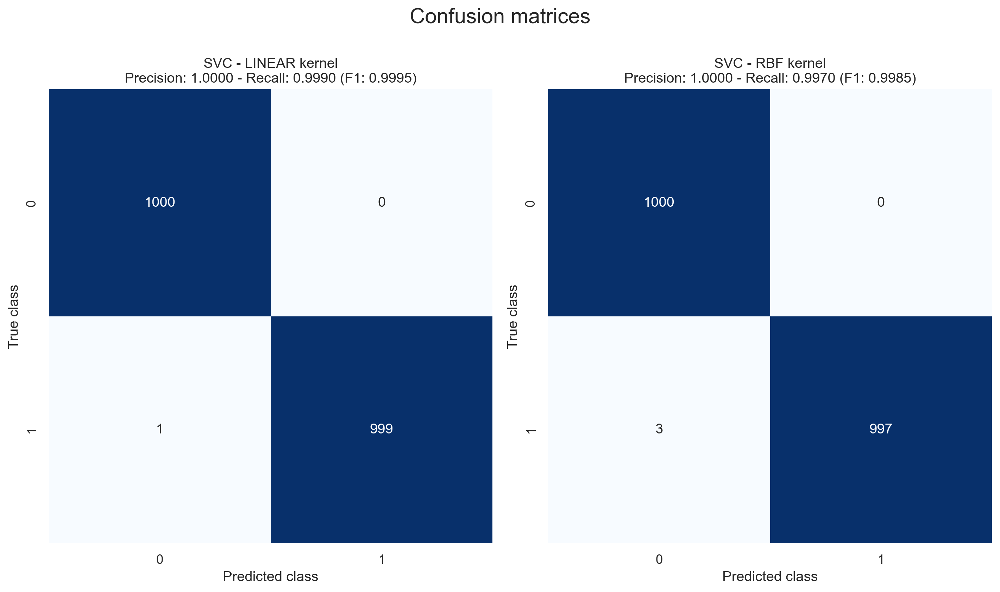

In [82]:
# Plot confusion matrices from model results
plt.figure(figsize=(12, 7))

for i, (name, result) in enumerate(results.items()):

    plt.subplot(1, 2, i+1)
    sns.heatmap(result['confusion_matrix'], annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f"""SVC - {name.upper()} kernel\nPrecision: {result['metrics']['precision']:.4f} - Recall: {result['metrics']['recall']:.4f} (F1: {result['metrics']['f1']:.4f})""")
    plt.xlabel('Predicted class')
    plt.ylabel('True class')

plt.suptitle(f"Confusion matrices", fontsize=18, y=1)
plt.tight_layout()
plt.show()

By observing all metrics and confusion matrices, for a classification threshold of 0.5 (default value used for prediction), all the models achieved extremely high values for all metrics. The model with linear kernel obtained only 0.001 higher values for accuracy and F1 score.

### ROC curves and Precision-Recall curves

Here, the Receiver Operating Characteristic (ROC) curves are calculated and visualized. The ROC curves are plots of the false positive rate versus the true positive rate for different classification thresholds values between 0.0 and 1.0.

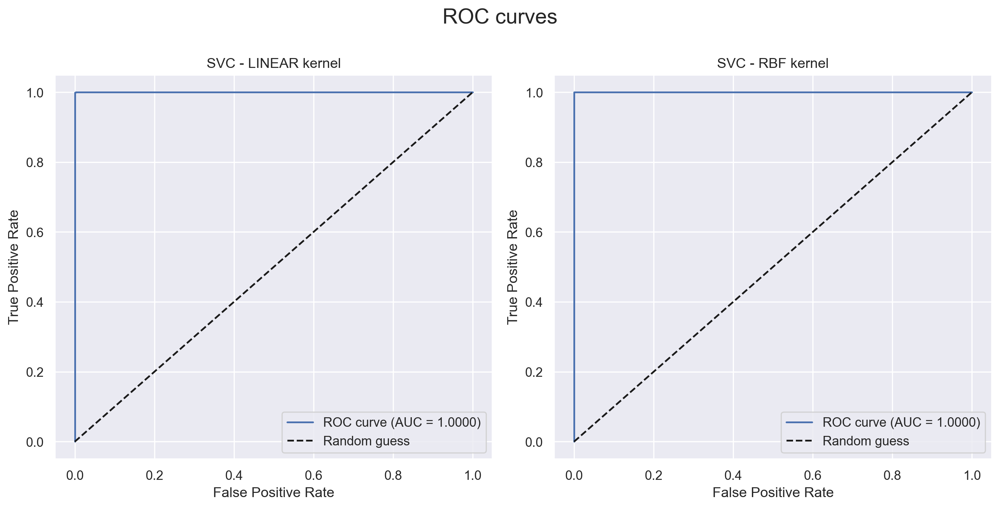

In [99]:
# Plot ROC curves from model results
plt.figure(figsize=(12, 6))

for i, (name, result) in enumerate(results.items()):

    plt.subplot(1, 2, i+1)

    fpr, tpr, _ = roc_curve(y_test, result["predictions"])
    plt.plot(fpr, tpr, label=f"ROC curve (AUC = {result["metrics"]['roc_auc']:.4f})")

    plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f"SVC - {name.upper()} kernel")
    plt.legend(loc='lower right')
    plt.grid(True)

plt.suptitle(f"ROC curves", fontsize=18, y=1)
plt.tight_layout()
plt.show()

In this case, the areas under the curve (AUC), representing a summary of the model skills, are at the maximum possible value (1) for both models.

The precision-recall curves, which plot the precision and the recall values for different classification thresholds, are also calculated and visualized.

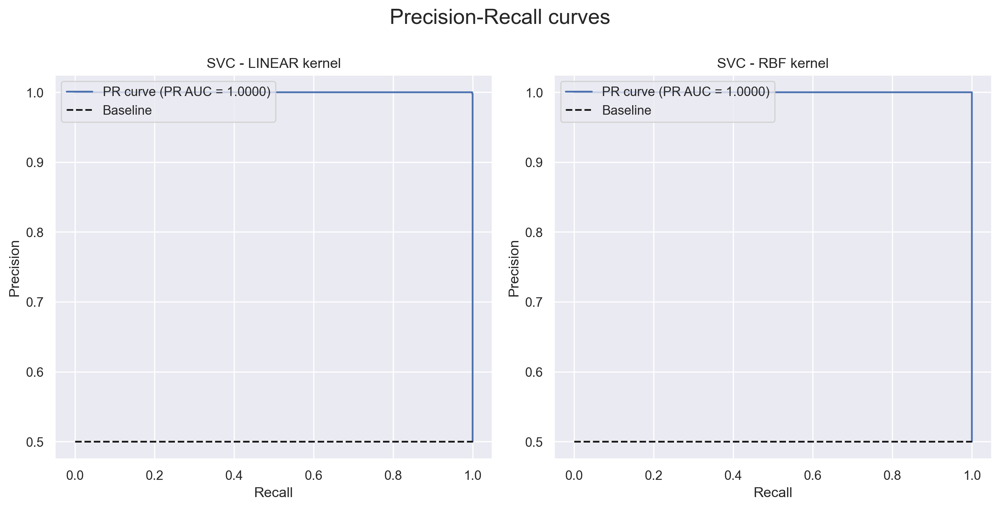

In [102]:
# Plot Precision-Recall curves from model results

plt.figure(figsize=(12, 6))

for i, (name, result) in enumerate(results.items()):

    plt.subplot(1, 2, i+1)

    precision, recall, _ = precision_recall_curve(y_test, result["predictions"])
    plt.plot(recall, precision, label=f"PR curve (PR AUC = {result["metrics"]['pr_auc']:.4f})")
    
    plt.plot([0, 1], [sum(y_test)/len(y_test)]*2, 'k--', label='Baseline')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f"SVC - {name.upper()} kernel")
    plt.legend(loc='upper left')
    plt.grid(True)

plt.suptitle(f"Precision-Recall curves", fontsize=18, y=1)
plt.tight_layout()
plt.show()

It can be observed that the AUC values in the Precision-Recall curves also obtained the maximum value of 1. As the dataset was perfectly balanced, this equality between ROC AUC and Precision-Recall AUC is an expected result.

## 5) Visualization of detections in full images

Despite the trained models appear highly reliable with the test dataset, they should be tested with a real application. For this, a proper **face detection pipeline** must be implemented, with the following functionalities:
- Take an image of any size as input
- Return a list of image coordinates (**bounding boxes**) where a face is present; if no face is detected an empty list is returned
- Show the image with all the bounding boxes corresponding to detected faces

### Implementing face detection pipeline

To obtain this, some additional algorithms must be implemented. 

The first is a **sliding window** method, which allow the model to loop over portions of the original image (of 128x128 pixels, corresponding to the size of training images) and make a prediction. To reduce the number of images processed by the model and decrease the computation effort, the sliding window can skip some pixel in both the x and y directions. More information on the sliding window for object detection method with examples of implementation can be found in these articles:
- [Sliding Windows for Object Detection with Python and OpenCV](https://pyimagesearch.com/2015/03/23/sliding-windows-for-object-detection-with-python-and-opencv/)
- [Sliding Window Technique & Opencv for robust Object Detection](https://medium.com/@saipoojithasajjavarapu/sliding-window-technique-opencv-for-robust-object-detection-d47bf5ec5496)

In [3]:
# Define a function for applying the sliding window
def sliding_window(image, step_size, window_size):
    """Yield top-left x, y and the window"""
    for y in range(0, image.shape[0] - window_size[1] + 1, step_size):
        for x in range(0, image.shape[1] - window_size[0] + 1, step_size):
            yield x, y, image[y:y + window_size[1], x:x + window_size[0]]

However, using the sliding window method, the face detector is likely to outputs a large number of overlapping bounding boxes containing faces. Therefore, it is necessary to apply the **Non-Maximum Suppression (NMS)** algorithm, a method used in object detection to remove overlapping boxes that are detected around the same object, by retaining the bounding box with the highest confidence score. 

In this algorithm, all the bounding boxes generated by the model are sorted in descending order based on their confidence scores. Starting with the box with the highest score, the **Intersection over Union (IoU)**, a measure of the area overlap, with all remaining boxes is calculated. If the IoU of any of these boxes exceeds a threshold (typically 0.5) they are discarded.

More detailed information and examples of implementation of the NMS can be found in these artcles:
- [Non Maximum Suppression: Theory and Implementation in PyTorch](https://learnopencv.com/non-maximum-suppression-theory-and-implementation-in-pytorch/)
- [How to Code Non-Maximum Suppression (NMS) in Plain NumPy](https://blog.roboflow.com/how-to-code-non-maximum-suppression-nms-in-plain-numpy/)
- [(Faster) Non-Maximum Suppression in Python](https://pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/)

In this implementation a function to calculate IoU of two boxes is first defined and it is then used in a function for the NMS to determine the overlap between the top box by score and all the others. Only the boxes with IoU below the threshold of 0.5 are retained. The function will continue until all boxes are evaluated.

In [4]:
# Define functions for Intersection over Union of two boxes and Non-Maximum Suppression

def compute_iou(boxA, boxB):
    """IoU of two boxes defined by: (x1, y1, x2, y2)."""

    # Find the largest and smallest coordinates to define the intersection
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # Calculate the intersection area
    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    inter  = interW * interH
    if inter == 0:
        return 0.0

    # Calculate the area of the two boxes
    areaA = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    areaB = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    # Calculate and return the ratio of intersection area and the union area of both the boxes
    return inter / float(areaA + areaB - inter)

def non_max_suppression(boxes, scores, thresh=0.5):
    """Remove overlapping boxes, keeping those with highest score."""
    if len(boxes) == 0:
        return [], []

    boxes  = np.array(boxes, dtype=float)
    scores = np.array(scores)

    # Sort indices by score (highest first)
    idxs = scores.argsort()[::-1]
    keep = []

    while len(idxs) > 0:
        i = idxs[0]
        keep.append(i)

        # Calculate IoU of the top box with the rest
        rest = idxs[1:]
        overlap = np.array([compute_iou(boxes[i], boxes[j]) for j in rest])

        # Keep only boxes with IoU below threshold
        idxs = rest[overlap < thresh]

    return boxes[keep].astype(int).tolist(), scores[keep].tolist()

Then, a function to run the face detetion model on a single image, combining all the implemented algorithms is defined. Lastly, a function to draw the resulting bounding boxes on the original image is defined.

In [5]:
# Define sliding window and NMS parameters
WIN_SIZE = (128, 128)   # window size (same as training image size)
STEP_SIZE = 16          # pixels to skip in x and y directions
NMS_THRESH = 0.50       # IoU threshold for Non-Maximum Suppression

# Load the best trained model
MODEL = joblib.load("svc_linear_best.joblib")

In [ ]:
# Define a function to run the sliding window, extraxt HOG descriptor, run the face detection model 
# and apply the Non-Maximum Suppression
def detect_faces_in_image(image_bgr, prob_thresh=0.80):
    """Run sliding-window face detection on a single BGR image."""
    boxes   = []
    scores  = []

    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    for x, y, patch in sliding_window(gray, STEP_SIZE, WIN_SIZE):
        # Extract HOG descriptor and reshape to a 1D array
        feat = hog(patch, **hog_params).reshape(1, -1)

        prob = MODEL.predict_proba(feat)[0][1]  # probability of class 1 (face)
        if prob >= prob_thresh:  # keep only detections above a defined probability threshold (default=0.8)
            boxes.append((x, y, x + WIN_SIZE[0], y + WIN_SIZE[1]))
            scores.append(prob)

    # Apply Non-Maximum Suppression
    final_boxes, final_scores = non_max_suppression(boxes, scores, NMS_THRESH)
    return final_boxes, final_scores, prob_thresh

# Define a function to draw the final bounding boxes on a copy of the original image
def draw_boxes(image_bgr, boxes, scores):
    vis = image_bgr.copy()
    for (x1, y1, x2, y2), s in zip(boxes, scores):
        cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(vis, f"{s:.2f}", (x1, y1 - 6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
    return vis

Now, the face detection pipeline implemented is tested in some example images with multiple faces.

### Example 1

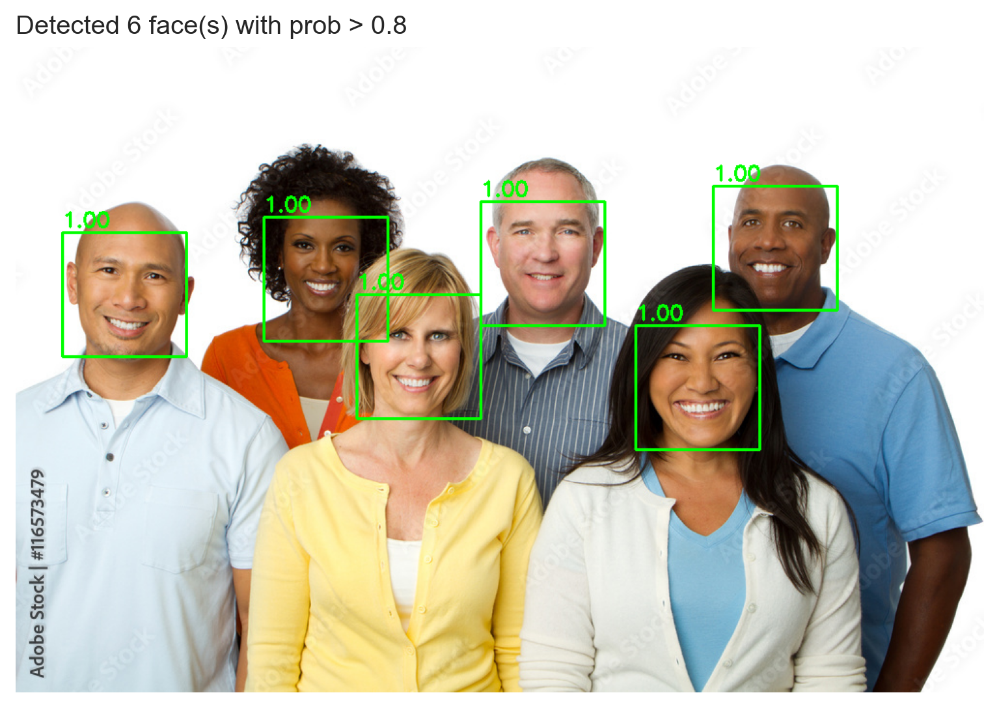

In [23]:
image_bgr = cv2.imread(Path("AdobeStock_116573479_Preview.jpeg"))

boxes, scores, prob_thresh = detect_faces_in_image(image_bgr, 0.8)

image_vis = cv2.cvtColor(draw_boxes(image_bgr, boxes, scores), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6)) 
plt.imshow(image_vis)
plt.title(f"Detected {len(boxes)} face(s) with prob > {prob_thresh}", loc='left')
plt.axis("off")
plt.show()

In this first example, the face detection algorithm (with a probability threshold of 0.8) correctly identifies all the faces in the input image with the maximum score. No false positives are detected.

### Example 2

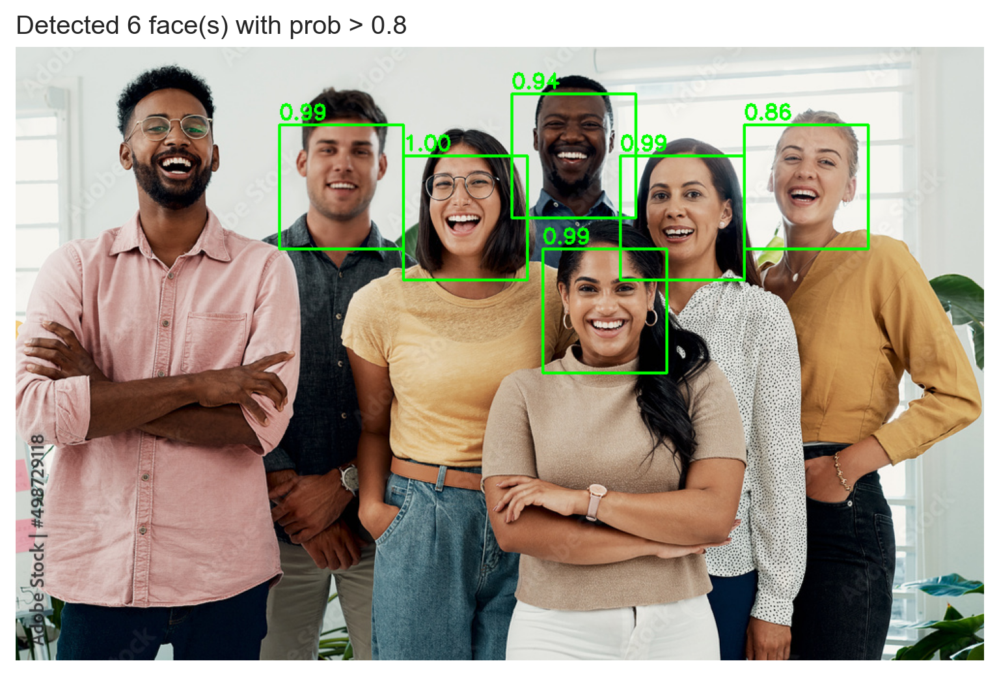

In [22]:
image_bgr = cv2.imread(Path("AdobeStock_498729118_Preview.jpeg"))

boxes, scores, prob_thresh = detect_faces_in_image(image_bgr, 0.8)

image_vis = cv2.cvtColor(draw_boxes(image_bgr, boxes, scores), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6)) 
plt.imshow(image_vis)
plt.title(f"Detected {len(boxes)} face(s) with prob > {prob_thresh}", loc='left')
plt.axis("off")
plt.show()

In this example, 6 faces out of the 7 present in the images are detected, with scores ranging from 0.86 to 1. So, in this case, 1 false negative is present but no false positives.

### Example 3

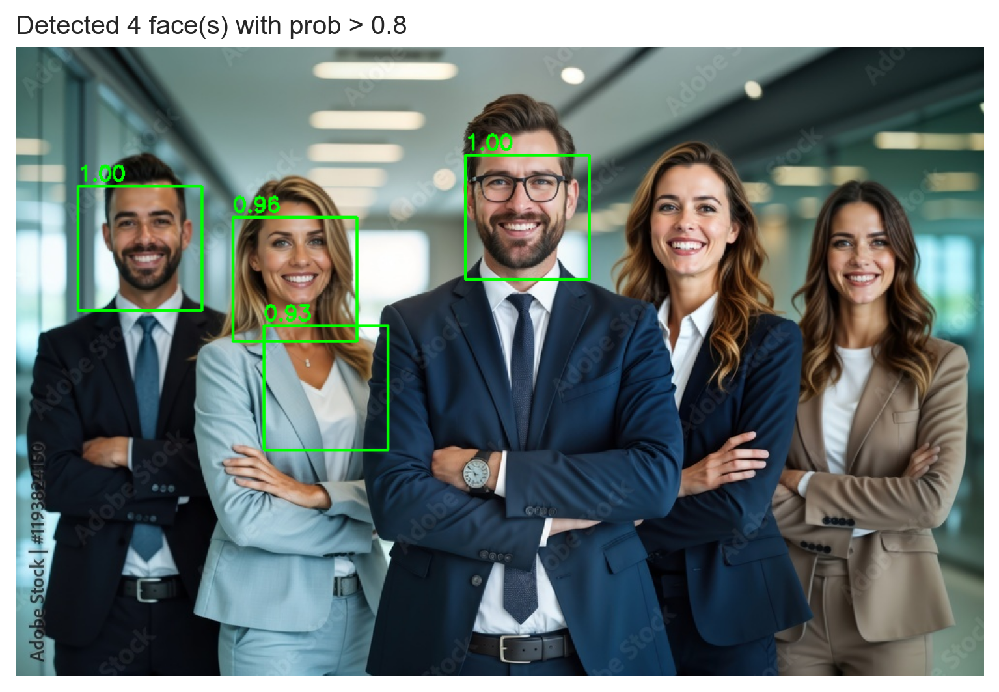

In [24]:
image_bgr = cv2.imread(Path("AdobeStock_1193824150_Preview.jpeg"))

boxes, scores, prob_thresh = detect_faces_in_image(image_bgr, 0.8)

image_vis = cv2.cvtColor(draw_boxes(image_bgr, boxes, scores), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6)) 
plt.imshow(image_vis)
plt.title(f"Detected {len(boxes)} face(s) with prob > {prob_thresh}", loc='left')
plt.axis("off")
plt.show()

In this example, only 3 out of 5 faces are detected, and 1 false positive is also present. It is possible to run the model on the same image with the probability threshold reduced from 0.8 to 0.7, to test if the 2 false negatives are removed.

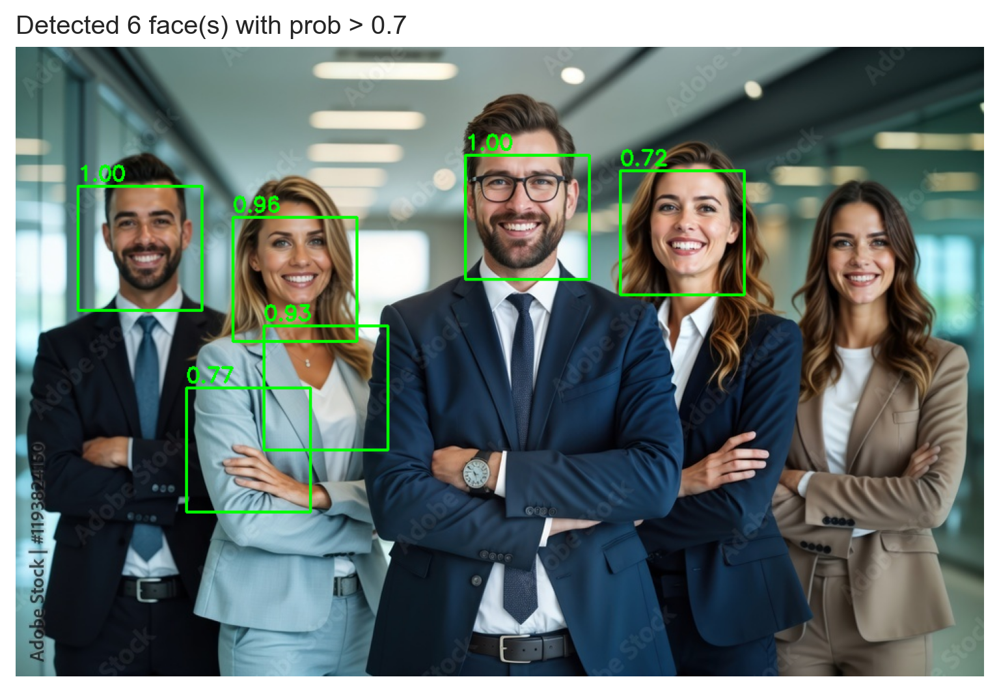

In [25]:
image_bgr = cv2.imread(Path("AdobeStock_1193824150_Preview.jpeg"))

boxes, scores, prob_thresh = detect_faces_in_image(image_bgr, 0.7)

image_vis = cv2.cvtColor(draw_boxes(image_bgr, boxes, scores), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6)) 
plt.imshow(image_vis)
plt.title(f"Detected {len(boxes)} face(s) with prob > {prob_thresh}", loc='left')
plt.axis("off")
plt.show()

Reducing the probability threshold to 0.7, 1 false negative is removed, but another false positive is detected.

# 6) Conclusions

In general, the trained face detection model appears to achieve the expected result in full real images, although with slightly lower performances respect to training and test datasets. More advanced detection algorithms, respect to the SVC considered in this implementation, and larger datasets with different face characteristics and sizes, would likely produce better results for this task.